# HairFast Inference Notebook

## Prepare Environment and Download HairFast Code

In [1]:
## clone repo
!git clone https://github.com/AIRI-Institute/HairFastGAN
%cd HairFastGAN

Cloning into 'HairFastGAN'...
remote: Enumerating objects: 513, done.
remote: Counting objects: 100% (513/513), done.
remote: Compressing objects: 100% (391/391), done.
remote: Total 513 (delta 73), reused 512 (delta 72), pack-reused 0
Receiving objects: 100% (513/513), 1.52 MiB | 7.43 MiB/s, done.
Resolving deltas: 100% (73/73), done.
/kaggle/working/HairFastGAN


In [2]:
!pip install -r requirements.txt

  Cloning https://github.com/openai/CLIP.git (to revision a1d071733d7111c9c014f024669f959182114e33) to /tmp/pip-install-mmc5b6kt/clip_09065a9a801d4dadb72f541d484c4d98
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-mmc5b6kt/clip_09065a9a801d4dadb72f541d484c4d98
  Running command git rev-parse -q --verify 'sha^a1d071733d7111c9c014f024669f959182114e33'
  Running command git fetch -q https://github.com/openai/CLIP.git a1d071733d7111c9c014f024669f959182114e33
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 53.3 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.4/159.4 kB 10.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Pr

In [3]:
!git clone https://huggingface.co/AIRI-Institute/HairFastGAN 
!cd HairFastGAN && git lfs pull && cd ..
!mv HairFastGAN/pretrained_models pretrained_models
!mv HairFastGAN/input input
!rm -rf HairFastGAN

Cloning into 'HairFastGAN'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 59 (delta 1), reused 0 (delta 0), pack-reused 1 (from 1)
Unpacking objects: 100% (59/59), 7.75 MiB | 6.96 MiB/s, done.
Filtering content: 100% (33/33), 7.20 GiB | 136.97 MiB/s, done.
Encountered 2 file(s) that should have been pointers, but weren't:
	docs/assets/diagram.webp
	docs/assets/logo.webp


## Model inference

In [4]:
#@title Initializing HairFast { display-mode: "form" }
import argparse
from pathlib import Path
from hair_swap import HairFast, get_parser


model_args = get_parser()
hair_fast = HairFast(model_args.parse_args([]))

Loading StyleGAN2 from checkpoint: pretrained_models/StyleGAN/ffhq.pt


Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

Loading e4e over the pSp framework from checkpoint: pretrained_models/encoder4editing/e4e_ffhq_encode.pt
Network [SPADEGenerator] was created. Total number of parameters: 266.9 million. To see the architecture, do print(network).


100%|███████████████████████████████████████| 335M/335M [00:11<00:00, 30.3MiB/s]


In [5]:
#@title Image drawing and downloader { display-mode: "form" }
import requests
from io import BytesIO
from PIL import Image
from functools import cache

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torchvision.transforms as T
import torch
%matplotlib inline


def to_tuple(func):
    def wrapper(arg):
        if isinstance(arg, list):
            arg = tuple(arg)
        return func(arg)
    return wrapper


@to_tuple
@cache
def download_and_convert_to_pil(urls):
    pil_images = []
    for url in urls:
        response = requests.get(url, allow_redirects=True, headers={"User-Agent": "Mozilla/5.0"})
        img = Image.open(BytesIO(response.content))
        pil_images.append(img)
        print(f"Downloaded an image of size {img.size}")
    return pil_images


def display_images(images=None, **kwargs):
    is_titles = images is None
    images = images or kwargs

    grid = gridspec.GridSpec(1, len(images))
    fig = plt.figure(figsize=(20, 10))

    for i, item in enumerate(images.items() if is_titles else images):
        title, img = item if is_titles else (None, item)

        img = T.functional.to_pil_image(img) if isinstance(img, torch.Tensor) else img
        img = Image.open(img) if isinstance(img, str | Path) else img

        ax = fig.add_subplot(1, len(images), i+1)
        ax.imshow(img)
        if title:
            ax.set_title(title, fontsize=20)
        ax.axis('off')

    plt.show()

# Check image

## Input Image

In [6]:
import shutil
import os

# Define a function to remove a directory and its contents recursively
def remove_folder(folder_path):
    shutil.rmtree(folder_path)

# Example usage:
if os.path.exists('/kaggle/working/Image'):
    remove_folder('/kaggle/working/Image')

%cd /kaggle/working/
!git clone https://github.com/HongQuan2003/21522490_final_ACV.git /kaggle/working/Image

/kaggle/working
Cloning into '/kaggle/working/Image'...
remote: Enumerating objects: 32, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 32 (delta 4), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (32/32), 15.32 MiB | 15.41 MiB/s, done.


In [7]:
%matplotlib inline

import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torchvision.io as io
from PIL import Image, ExifTags


def correct_orientation(image_input):
    try:
        
        if isinstance(image_input, str):
            image = Image.open(image_input)
        elif isinstance(image_input, Image.Image):
            image = image_input
        exif = image._getexif()
        
        if exif is not None:
            for orientation in ExifTags.TAGS.keys():
                if ExifTags.TAGS[orientation] == 'Orientation':
                    break

            orientation_value = exif.get(orientation)
             
            if orientation_value == 5:
                image = image.rotate(270, expand=True)
            
        return image
    
    except (AttributeError, KeyError, IndexError) as e:
        # Handle cases where the image does not have EXIF data or the required tags
        print(f"Error processing image EXIF data: {e}")
        return image

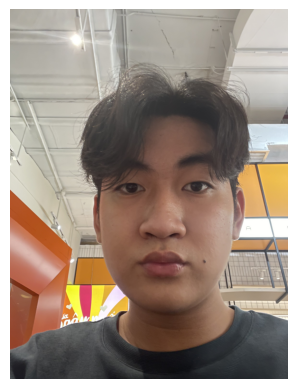

In [8]:
input_image_path = "/kaggle/working/Image/Input_image/IMG_0800.jpeg"

# Correct the image orientation
corrected_image = correct_orientation(input_image_path)
# Save the corrected image
corrected_image.save('/kaggle/working/corrected_image.jpg')

input_image_path = '/kaggle/working/corrected_image.jpg'

# Plot the image
plt.imshow(corrected_image)
plt.axis('off')
plt.show()

## Ref_image

### hairstyle

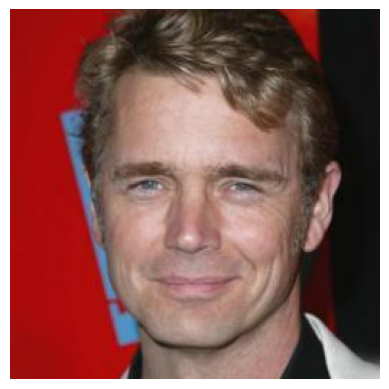

In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torchvision.io as io
import os

hairstyle_ref_image_path = "/kaggle/input/celebahq-resized-256x256/celeba_hq_256/00013.jpg"
hairstyle_ref_image = io.read_image(hairstyle_ref_image_path)

# Plot the image
plt.imshow(hairstyle_ref_image.permute(1, 2, 0))
plt.axis('off')
plt.show()

### Color

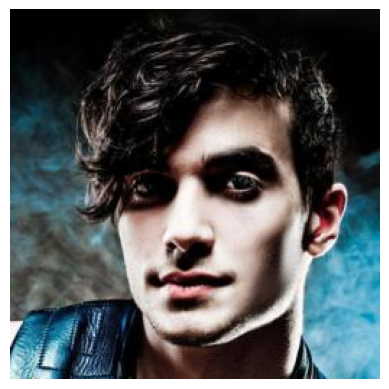

In [10]:
%matplotlib inline

import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torchvision.io as io
import os

color_ref_image_path = "/kaggle/input/celebahq-resized-256x256/celeba_hq_256/00003.jpg"
color_ref_image = io.read_image(color_ref_image_path)

# Plot the image
plt.imshow(color_ref_image.permute(1, 2, 0))
plt.axis('off')
plt.show()

# Transfer

In [11]:
%cd /kaggle/working/HairFastGAN

/kaggle/working/HairFastGAN


In [12]:
face = input_image_path
shape = hairstyle_ref_image_path
color = color_ref_image_path

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


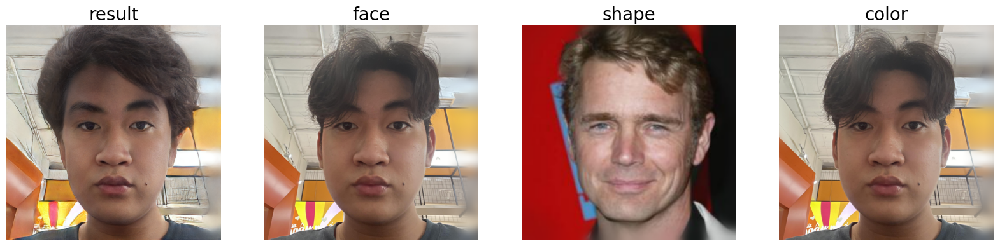

In [13]:
final_image, face_align, shape_align, color_align = \
    hair_fast.swap(face, shape, face, align=True)

display_images(result=final_image, face=face_align, shape=shape_align, color=color_align)

# Dowload image

In [14]:
face = input_image_path
shape = hairstyle_ref_image_path
color = color_ref_image_path

Downloaded an image of size (225, 225)
Downloaded an image of size (7680, 4320)


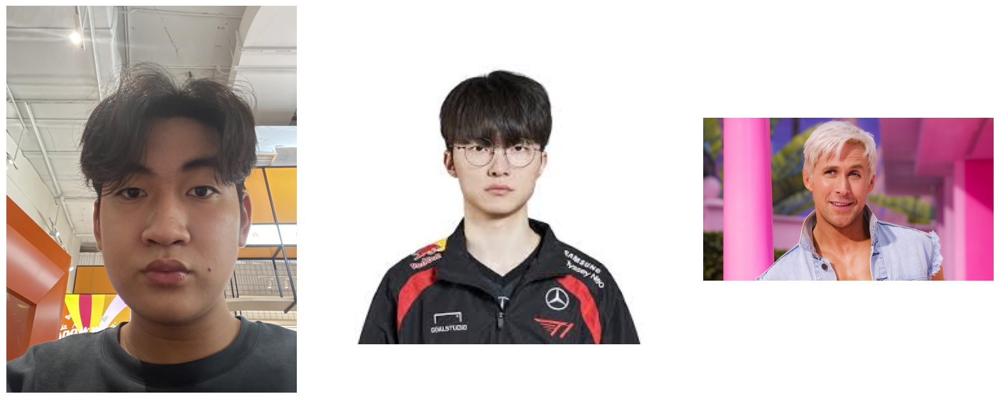

In [15]:
#@title Inference on internet images { display-mode: "form" }
shape, color = download_and_convert_to_pil([
    'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSaUkst7e8CYBggt6h24Ljv3oT4sW0rq7zjmvDIeL7RGQ&s',
    'https://i.imgur.com/9IK8Lta.jpeg'
     ])
display_images([face, shape, color])

## edit

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


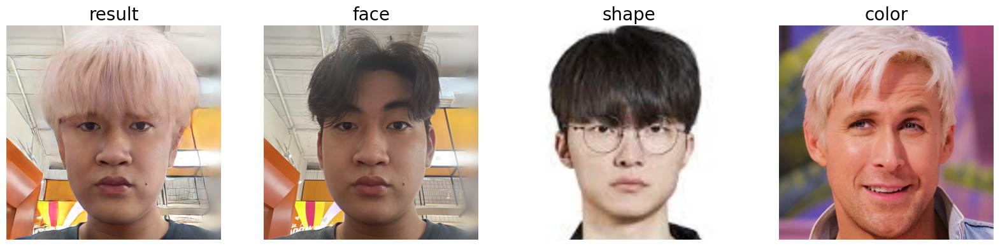

In [16]:
final_image, face_align, shape_align, color_align = \
    hair_fast.swap(face, shape, color, align=True)

display_images(result=final_image, face=face_align, shape=shape_align, color=color_align)

# Evaluate

In [17]:
import random
import torchvision.transforms.functional as TF

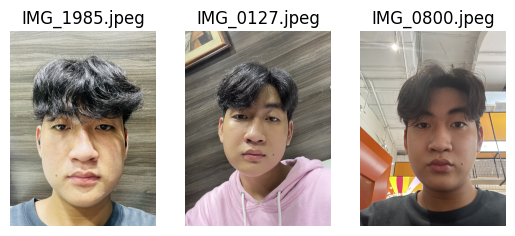

In [18]:
input_dir_path = "/kaggle/working/Image/Input_image"
input_dir = sorted(os.listdir(input_dir_path))

random.seed(101010)
input_images = random.sample(input_dir, 3)

correct_image_dir_path = "/kaggle/working/correct_image_eval/"
if os.path.exists(correct_image_dir_path) == True:
    remove_folder(correct_image_dir_path)
    os.mkdir(correct_image_dir_path)
else:
    os.mkdir(correct_image_dir_path)

fig, axes = plt.subplots(1,3)

for i, image_name in enumerate(input_images):
    
    image_path = os.path.join(input_dir_path, image_name)
    # Correct the image orientation
    corrected_image = correct_orientation(image_path)
    # Save the corrected image
    corrected_image.save(os.path.join(correct_image_dir_path, image_name))

    axes[i].imshow(corrected_image)
    axes[i].axis('off')
    axes[i].set_title(image_name)
#     plt.imshow(corrected_image)
#     plt.axis('off')
#     plt.show()


Hairstyle_images:


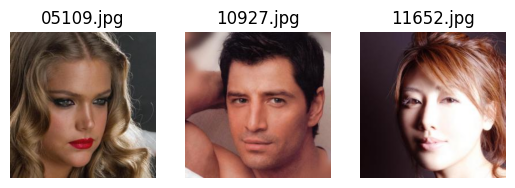

Color_images:


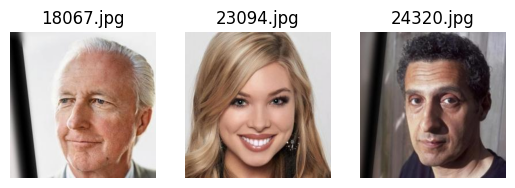

In [19]:
ref_dir_path = '/kaggle/input/celebahq-resized-256x256/celeba_hq_256'
ref_dir = sorted(os.listdir(ref_dir_path))

random.seed(202020)
ref_images = sorted(random.sample(ref_dir, 6))

hairstyle_images = ref_images[:3]
color_images = ref_images[3:]

hairstyle_dir_path = '/kaggle/working/hairstyle_image_eval'
if os.path.exists(hairstyle_dir_path) == True:
    remove_folder(hairstyle_dir_path)
    os.mkdir(hairstyle_dir_path)
else:
    os.mkdir(hairstyle_dir_path)

color_dir_path = '/kaggle/working/color_image_eval'
if os.path.exists(color_dir_path) == True:
    remove_folder(color_dir_path)
    os.mkdir(color_dir_path)
else:
    os.mkdir(color_dir_path)


print("Hairstyle_images:")
fig, axes = plt.subplots(1,3)
axes = axes.flatten()
for i, image_name in enumerate(hairstyle_images):
    
    image_path = os.path.join(ref_dir_path, image_name)
    # Correct the image orientation
    corrected_image = correct_orientation(image_path)
    # Save the corrected image
    corrected_image.save(os.path.join(hairstyle_dir_path, image_name))

    axes[i].imshow(corrected_image)
    axes[i].axis('off')
    axes[i].set_title(image_name)
    
plt.show()
    
print("Color_images:")
fig, axes = plt.subplots(1,3)
axes = axes.flatten()
for i, image_name in enumerate(color_images):
    
    image_path = os.path.join(ref_dir_path, image_name)
    # Correct the image orientation
    corrected_image = correct_orientation(image_path)
    # Save the corrected image
    corrected_image.save(os.path.join(color_dir_path, image_name))

    axes[i].imshow(corrected_image)
    axes[i].axis('off')
    axes[i].set_title(image_name)
plt.show()

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


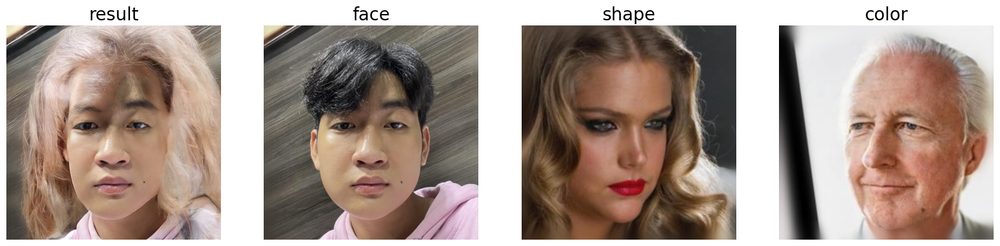

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


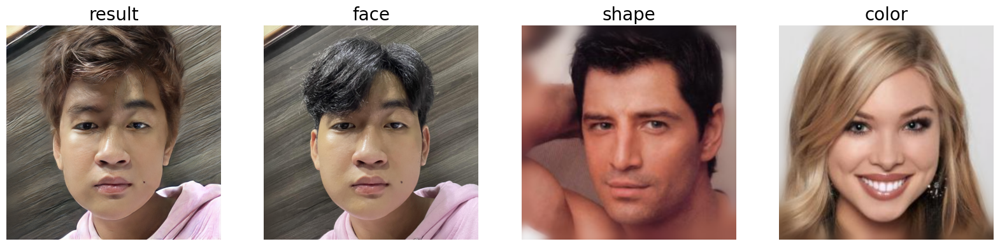

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


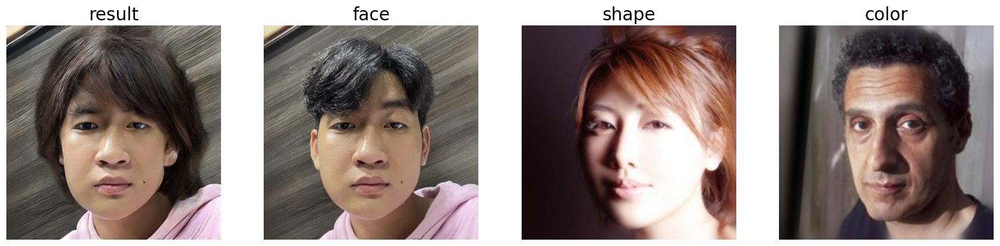

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


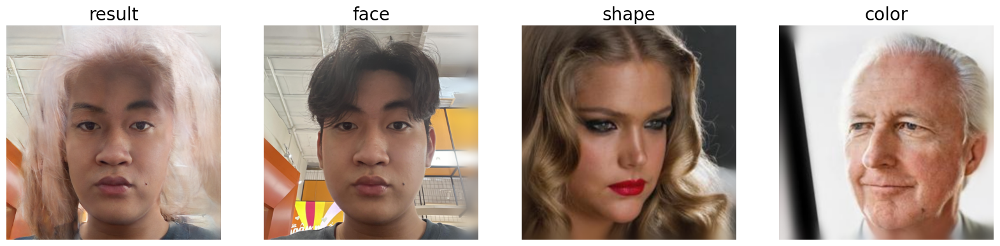

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


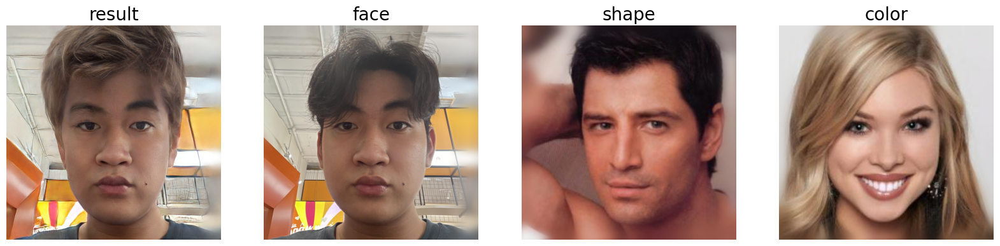

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


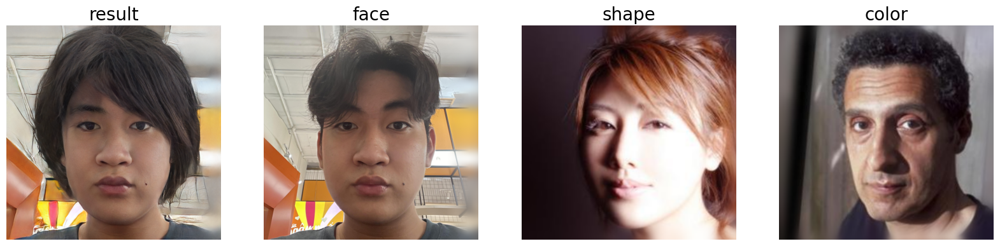

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


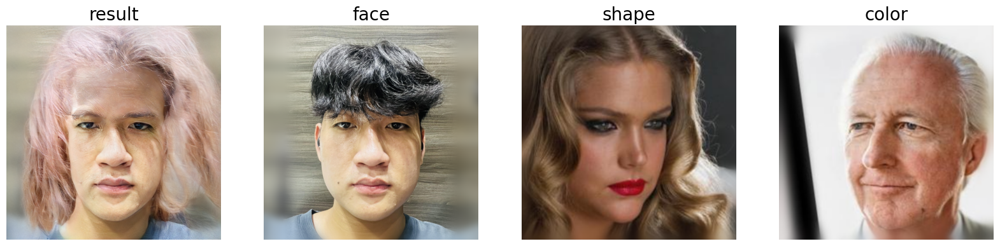

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


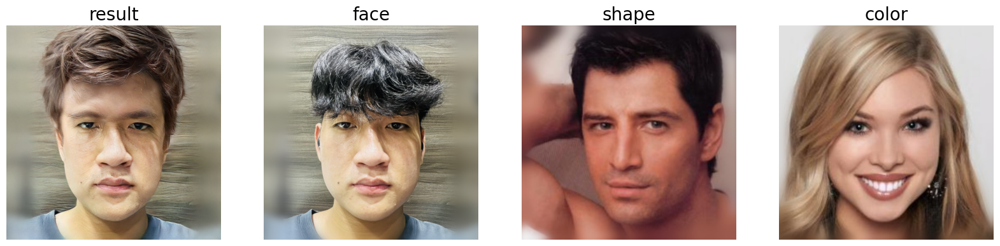

Number of faces detected: 1
Number of faces detected: 1
Number of faces detected: 1


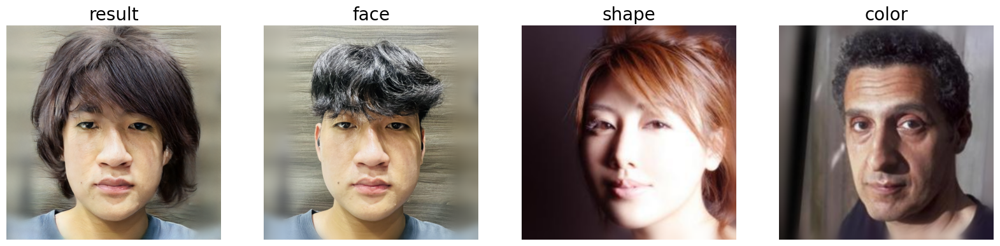

In [20]:
correct_image_dir_path = "/kaggle/working/correct_image_eval/"
correct_images = sorted(os.listdir(correct_image_dir_path))
hairstyle_dir_path = '/kaggle/working/hairstyle_image_eval'
hairstyle_images = sorted(os.listdir(hairstyle_dir_path))
color_dir_path = '/kaggle/working/color_image_eval'
color_images = sorted(os.listdir(color_dir_path))

result_dir_path = "/kaggle/working/results_eval/"
if os.path.exists(result_dir_path) == True:
    remove_folder(result_dir_path)
    os.mkdir(result_dir_path)
else:
    os.mkdir(result_dir_path)

for j, input_image in enumerate(correct_images):
    face = os.path.join(correct_image_dir_path, input_image)
    
    for i, (hairstyle_image, color_image) in enumerate(zip(hairstyle_images, color_images)):
        shape = os.path.join(hairstyle_dir_path, hairstyle_image)
        color = os.path.join(color_dir_path, color_image)

        final_image, face_align, shape_align, color_align = \
        hair_fast.swap(face, shape, color, align=True)
        
        final_image = TF.to_pil_image(final_image)
        
        result_path = os.path.join(result_dir_path, f'result_{input_image}_{hairstyle_image}_{color_image}.jpg')
        
        final_image.save(result_path)

        display_images(result=final_image, face=face_align, shape=shape_align, color=color_align)
        